# ADOM - Analiza danych obrazowych i multimedialnych

### Metoda: Histogram of Oriented Gradients (HOG) + Support Vector Machine (SVM)

**Członkowie zespołu:**
- Bartosz Malec
- Damian Wujkowski
- Szymon Newel
- Filip Sosnowski

**Data realizacji:** 05.06.2026

---
## 1. Omówienie metody HOG

### Do czego służy?

**HOG (Histogram of Oriented Gradients)** to deskryptor cech obrazu, szeroko stosowany w zadaniach detekcji obiektów o charakterystycznej i względnie stałej geometrii konturów, takch jak piesi, pojazdy czy znak drogowe. Klasycznym zastosowaniem jest połączenie meotdy HOG z SVM (Support Vector Machine), w którym HOG opisuje wygląd fragmentu obrazu (kontury) i jest wejściem do klasyfikatora SVM, który decyduje, czy zawiera on szukany obiekt.

### Na czym polega?

Algorytm HOG opiera się na założeniu, że lokalny kształt i wygląd obiektu wewnątrz obrazu mogą zostać opisane za pomocą rozkładu natężenia gradientów światła lub kierunków krawędzi konturu. Procedura wyznaczania wektora cech HOG przebiega w następujących etapach:

1. **Obliczanie gradientów:** Na początku obraz wejściowy poddawany jest operacji filtrowania, co pozwala wyznaczyć wartości zmian jasności w pionie i poziomie dla każdego piksela. Na ich podstawie obliczana jest orientacja (w którą stronę skierowana jest krawędź) oraz amplituda  gradientu przedstawiane jako wektor [Gx, Gy] (jak silna jest krawędź). Wykonujemy filtr [-1, 0, 1] w poziomie i pionie.
2. **Podział na komórki i histogramy:** Obraz dzielony jest komórki (np. o rozmiarze 8x8 pikseli). Dla każdej komórki budowany jest histogram zorientowanych gradientów, gdzie każdy piksel oddaje „głos” do odpowiedniego przedziału histogramu z wagą proporcjonalną do amplitudy gradientu.
3. **Grupowanie w bloki i normalizacja:** Aby zrekompensować wpływ cieni i zmian oświetlenia, sąsiadujące komórki są łączone w większe, nakładające się bloki (np. o rozmiarze 2x2 komórki). Wektor cech wszystkich komórek wewnątrz danego bloku podlega wspólnej normalizacji (stosowana jest np. norma L2-Hys). Bloki nakładają się, czyli pojedyncza komórka bierze wielokrotnie udział w normalizacji w ramach różnych bloków.
4. **Złożenie wektora cech:** Znormalizowane wektory ze wszystkich bloków są sekwencyjnie łączone, tworząc ostateczny globalny wektor cech HOG.


**Klasyfikacja SVM** - Deskryptor HOG jest podawany na wejście klasyfikatora SVM. Wytrenowany SVM uczy się, które wektory HOG odpowiadają poszukiwanemu obiektowi. Liniowy SVM szuka hiperpłaszczyzny, która najlepiej oddziela w tej wielowymiarowej przestrzeni punkty reprezentujące obiekt od punktów reprezentujących tło. OpenCV dostarcza gotowy detektor `HOGDescriptor_getDefaultPeopleDetector()` wytrenowany na datasecie INRIA. Dzięki temu nie ma konieczności samodzielnego trenowania SVM.

**Piramida skalowania** - W celu znalezienia obiektów różnej wielkości (np. małe osoby na drugim planie) obraz jest wielokrotnie skalowany w dół. Za pomocą mechanizmu okna detekcyjnego (ang. *sliding window*) algorytm przesuwa się po każdej skali w celu znalezienia obiektów.

### Przydatne linki

| Zasób | Link |
|---|---|
| Oryginalna praca Dalal & Triggs (2005) | https://lear.inrialpes.fr/people/triggs/pubs/Dalal-cvpr05.pdf |
| Tutorial scikit-image (HOG) | https://scikit-image.org/docs/stable/auto_examples/features_detection/plot_hog.html |
| Tutorial PyImageSearch (HOG + SVM) | https://pyimagesearch.com/2014/11/10/histogram-oriented-gradients-object-detection/ |
| Tutorial z LearnOpenCV z przykładami | https://learnopencv.com/histogram-of-oriented-gradients/ | 
| Dokumentacja scikit-image `hog()` | https://scikit-image.org/docs/stable/api/skimage.feature.html#skimage.feature.hog |
| Dokumentacja OpenCV `HOGDescriptor` | https://docs.opencv.org/4.x/d5/d33/structcv_1_1HOGDescriptor.html |



## 2. Instalacja bibliotek

Przed rozpoczęciem pracy należy zainstalować wszystkie niezbędne biblioteki poniższą komendą

In [ ]:
%pip install matplotlib scikit-image opencv-python numpy scikit-learn --quiet

---
## 3. Omówienie wykorzystanej implementacji

W tym notatniku korzystamy z **dwóch niezależnych implementacji HOG**:

### 3a. `skimage.feature.hog` (scikit-image)
```python
from skimage.feature import hog
out, hog_image = hog(
    image,
    orientations=9,        # liczba kątów w histogramie (domyślnie 9, zakres 0°–180°)
    pixels_per_cell=(8,8), # rozmiar jednej komórki w pikselach
    cells_per_block=(2,2), # ile komórek tworzy jeden blok (do normalizacji)
    block_norm='L2-Hys',   # schemat normalizacji bloku
    visualize=True,        # zwróć wizualizację HOG jako obraz
    channel_axis=-1        # ostatni wymiar = kanały RGB
)
# out - wektor cech
# hog_image - wizualizacja HOG
```
- Elastyczny, konfigurowalny deskryptor HOG.
- Pozwala sterować: liczbą orientacji, rozmiarem komórki (`pixels_per_cell`), rozmiarem bloku (`cells_per_block`), metodą normalizacji (`block_norm`), korekcją gamma (`transform_sqrt`), liczbą kątów w histogramie (`orientations`).
- **Zastosowanie:** eksploracja parametrów, wizualizacja

### 3b. `cv2.HOGDescriptor` z `HOGDescriptor_getDefaultPeopleDetector()` (OpenCV)
```python
import cv2
hog_cv = cv2.HOGDescriptor()
hog_cv.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())
rects, weights = hog_cv.detectMultiScale(
    gray_image,
    winStride=(8, 8),   # krok przesuwania okna (mały = wolniej, ale dokładniej)
    padding=(16, 16),   # margines obrazu do poszukiwań
    scale=1.05          # współczynnik skalowania piramidy obrazowej
)
```
- Gotowy do użycia detektor pieszych oparty na HOG + liniowym SVM.
- Wytrenowany na datasecie INRIA - ok. 2400 pozytywnych i 1200 negatywnych przykładów okien 64×128 px.
- `detectMultiScale()` uruchamia piramidę skalowania i sliding window w jednym wywołaniu.
- Pozwala sterować: krokiem przesuniecia okna, dopełnienieniem wokół okna, współczynnikiem skalowania piramidy.

## Schemat blokowy HOG + SVM

In [29]:
output = """
╔═══════════════╗   gradient   ╔══════════════╗   histogram   ╔══════════════╗     normalizacja    ╔════════════════╗    wektor    ╔══════════════╗   decyzja    ╔══════════════╗
║   Obraz wej.  ║ ───────────> ║    Gx, Gy    ║ ────────────> ║  Komórki HOG ║ ──────────────────> ║    Bloki HOG   ║ ───────────> ║     SVM      ║ ───────────> ║  (człowiek?) ║
║  (64x128 px)  ║              ║ (per piksel) ║               ║   (8x8 px)   ║                     ║  (2x2 komór.)  ║              ║  (liniowy)   ║              ║    Tak/Nie   ║
╚═══════════════╝              ╚══════════════╝               ╚══════════════╝                     ╚════════════════╝              ╚══════════════╝              ╚══════════════╝
"""
print(output)


╔═══════════════╗   gradient   ╔══════════════╗   histogram   ╔══════════════╗     normalizacja    ╔════════════════╗    wektor    ╔══════════════╗   decyzja    ╔══════════════╗
║   Obraz wej.  ║ ───────────> ║    Gx, Gy    ║ ────────────> ║  Komórki HOG ║ ──────────────────> ║    Bloki HOG   ║ ───────────> ║     SVM      ║ ───────────> ║  (człowiek?) ║
║  (64x128 px)  ║              ║ (per piksel) ║               ║   (8x8 px)   ║                     ║  (2x2 komór.)  ║              ║  (liniowy)   ║              ║    Tak/Nie   ║
╚═══════════════╝              ╚══════════════╝               ╚══════════════╝                     ╚════════════════╝              ╚══════════════╝              ╚══════════════╝



---
## 4. Wizualizacja deskryptora
Po lewej - obraz wejściowy, w środku - mapa gradientów (co "widzi" HOG), po prawej - wynik detekcji pieszych przy wykorzystaniu SVM.

- wielkość ramki = 64x128px  
- piksele na komórkę = 8x8  
- komórki na blok = 2x2  
> Zmienna `image_path` wskazuje zdjęcie źródłowe. Przykładowe zdjęcia są w katalogu `images/`.  

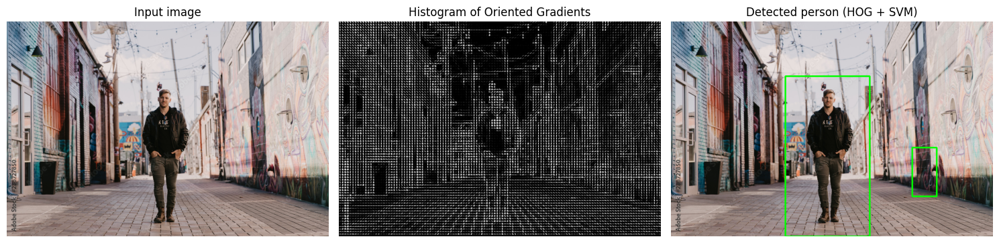

In [30]:
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import exposure
import cv2
import numpy as np

image_path = "./images/zdj.jpg"
image = plt.imread(image_path)

if len(image.shape) == 2:
    image = np.stack([image]*3, axis=-1)


fd, hog_image = hog(
    image,
    orientations=9,
    pixels_per_cell=(8, 8),
    cells_per_block=(2, 2),
    visualize=True,
    channel_axis=-1,
)

hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))


gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

hog_cv = cv2.HOGDescriptor()
hog_cv.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

rects, weights = hog_cv.detectMultiScale(
    gray,
    winStride=(8, 8),
    padding=(16, 16),
    scale=1.05
)

img_detected = image.copy()
for (x, y, w, h) in rects:
    cv2.rectangle(img_detected, (x, y), (x + w, y + h), (0, 255, 0), 3)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 6))

ax1.axis('off')
ax1.imshow(image)
ax1.set_title('Input image')

ax2.axis('off')
ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
ax2.set_title('Histogram of Oriented Gradients')

ax3.axis('off')
ax3.imshow(img_detected)
ax3.set_title('Detected person (HOG + SVM)')

plt.tight_layout()
plt.show()

### Wnioski:
Jak widać osoba na pierwszym planie została prawidłowo wykryta. Niestety SVM wykrył również człowieka tam gdzie nie powinien. Na histogramie krawędzi gołym okiem widać obrys tylko jednej postaci. W późniejszych krokach będziemy próbowali dobrać odpowiednie parametry, które zniwelują błędną detekcję. 

---
## 4a. Wizualizacja sliding window
Poniższy eksperyment działa w identyczny sposób co powyższy, natomiast uruchomienie go włączy animację sliding window, która pokazuje krok po kroku, jak algorytm analizuje układ krawędzi w lokalnych obszarach. Zielona ramka przechodzi przez oryginalny obrazek, a po całkowitym przejściu obrazek jest skalowany w dół (ramka ma cały czas ten sam wymiar) aby móc wykryć małe obiekty. 

Finalnie uruchamiamy nauczony detektor OpenCV (SVM), który namierza ludzi i stawia na nich zielone prostokąty.

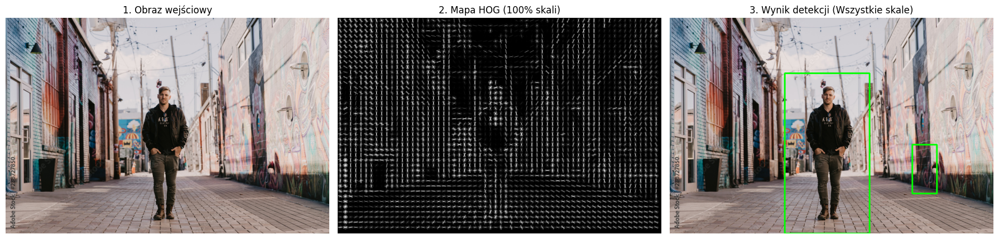

In [31]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import exposure
from IPython.display import display, clear_output
import time

image_path = "images/zdj.jpg"
image_raw = plt.imread(image_path)

if len(image_raw.shape) == 2:
    image_raw = np.stack([image_raw] * 3, axis=-1)

hog_cv = cv2.HOGDescriptor()
hog_cv.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

win_width, win_height = 64, 128
scales = [1.0, 0.5]
step_size = 80

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

try:
    for scale in scales:
        new_w = int(image_raw.shape[1] * scale)
        new_h = int(image_raw.shape[0] * scale)
        img_scaled = cv2.resize(image_raw, (new_w, new_h))

        for y in range(0, img_scaled.shape[0] - win_height, step_size):
            for x in range(0, img_scaled.shape[1] - win_width, step_size):
                roi = img_scaled[y:y + win_height, x:x + win_width]

                fd, hog_roi_viz = hog(
                    roi,
                    orientations=8,
                    pixels_per_cell=(16, 16),
                    cells_per_block=(1, 1),
                    visualize=True,
                    channel_axis=-1
                )

                ax1.clear()
                clone = img_scaled.copy()
                cv2.rectangle(clone, (x, y), (x + win_width, y + win_height), (0, 255, 0), 5)
                ax1.imshow(clone)
                ax1.set_title(f"Skala: {int(scale*100)}% | Skanowanie okno 64x128")
                ax1.axis('off')

                ax2.clear()
                hog_rescaled = exposure.rescale_intensity(hog_roi_viz, in_range=(0, 10))
                ax2.imshow(hog_rescaled, cmap='gray')
                ax2.set_title("To 'widzi' SVM (HOG)")
                ax2.axis('off')

                display(fig)
                clear_output(wait=True)
                time.sleep(0.001)
except KeyboardInterrupt:
    print("Zatrzymano animację.")

plt.close(fig)

gray = cv2.cvtColor(image_raw, cv2.COLOR_RGB2GRAY)

rects, weights = hog_cv.detectMultiScale(
    gray,
    winStride=(8, 8),
    padding=(16, 16),
    scale=1.05
)

img_detected = image_raw.copy()
for (x, y, w, h) in rects:
    cv2.rectangle(img_detected, (x, y), (x + w, y + h), (0, 255, 0), 3)

_, hog_full_viz = hog(image_raw, orientations=8, pixels_per_cell=(16, 16),
                       cells_per_block=(1, 1), visualize=True, channel_axis=-1)
hog_full_rescaled = exposure.rescale_intensity(hog_full_viz, in_range=(0, 10))

fig_final, (f1, f2, f3) = plt.subplots(1, 3, figsize=(18, 6))
f1.imshow(image_raw); f1.set_title('1. Obraz wejściowy'); f1.axis('off')
f2.imshow(hog_full_rescaled, cmap='gray'); f2.set_title('2. Mapa HOG (100% skali)'); f2.axis('off')
f3.imshow(img_detected); f3.set_title('3. Wynik detekcji (Wszystkie skale)'); f3.axis('off')

plt.tight_layout()
plt.show()

---
## 5. Eksperymenty z parametrami HOG

W tej części sprawdzamy, jak zmiana głównych parametrów algorytmu HOG wpływa na dwie kluczowe rzeczy: 
1. Jak dokładnie rozróżniane są kształty?  
2. Ile danych musi przy tym przetworzyć?  

Szukamy najlepszego ustawienia liczby kierunków i liczby pikseli na komórkę.

**Eksperyment 1: Liczba kierunków (Orientations: 4, 9, 18)**
* Sprawdzamy, na ile różnych kierunków (kątów) dzielimy linie i krawędzie na obrazku, żeby opisać kształt postaci.
* Co z tego wynika?
    * **4 kierunki:** Zarysy postaci stają się zbyt uproszczone i rozmazane, przez co komputer gubi ważne linie.
    * **18 kierunków:** Krawędzie są bardzo dokładne, ale algorytm tworzy tak duży wektor, że komputer zaczyna drastycznie zwalniać.
    * **9 kierunków:** Złoty środek, który daje wystarczająco precyzyjny kształt sylwetki i nie obciąża komputera.

**Eksperyment 2: Liczba pikseli na komórkę (Pixels Per Cell: 4x4, 8x8, 16x16)**
* Obrazek dzielimy na siatkę komórek, w których komputer analizuje linie. Szukamy balansu między dostrzeganiem detali a szybkością działania.
* Co z tego wynika?
    * **4x4:** Widzi każdy najdrobniejszy szczegół, ale liczba danych bardzo wydłuża analizę.
    * **16x16** Działa szybko, ale można całkowicie przegapić mniejsze postacie lub szczegóły rąk i nóg.
    * **8x8:** To optymalny wybór, ponieważ łączy dobrą wykrywalność z szybkim działaniem programu.

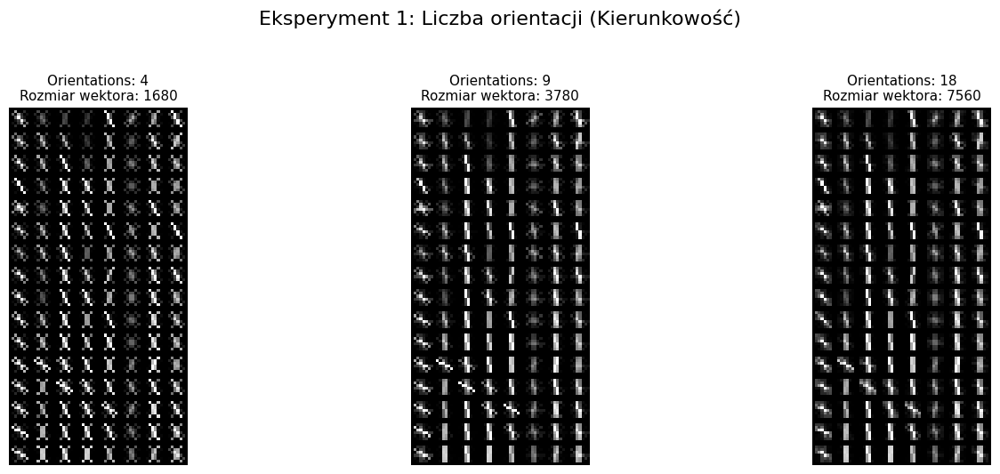

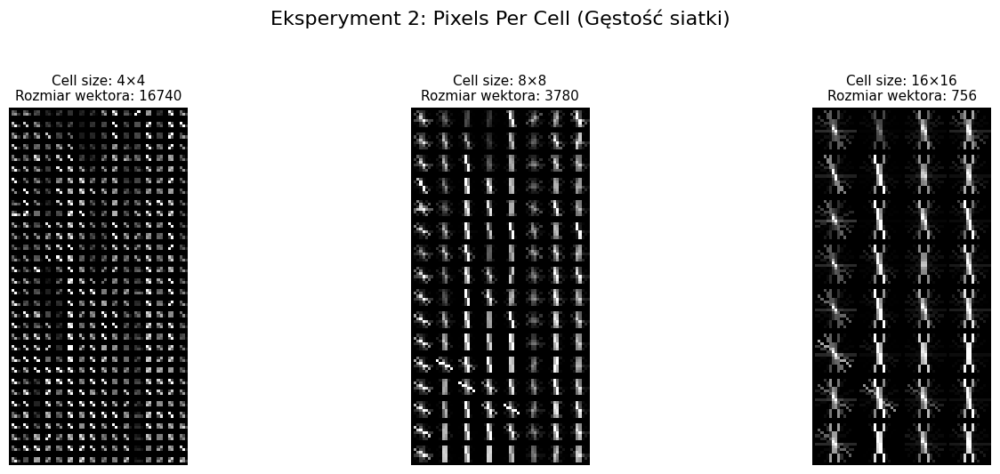

In [32]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import exposure
import cv2

image_raw = cv2.imread('images/zdj.jpg')

if image_raw is None:
    raise FileNotFoundError("Nie wczytano obrazu! Sprawdź czy plik istnieje pod images/zdj.jpg")

image_raw = cv2.cvtColor(image_raw, cv2.COLOR_BGR2RGB)

roi = cv2.resize(image_raw[50:250, 100:200], (64, 128))

def analyze_hog(img, orientations=9, ppc=8):
    fd, hog_image = hog(img,
                        orientations=orientations,
                        pixels_per_cell=(ppc, ppc),
                        cells_per_block=(2, 2),
                        visualize=True,
                        channel_axis=-1,
                        block_norm='L2-Hys',
                        transform_sqrt=True)

    hog_rescaled = exposure.rescale_intensity(hog_image,
                                              in_range=(0, np.percentile(hog_image, 98)))
    return fd, hog_rescaled


# ==================== EKSPERYMENT 1: Liczba orientacji ====================
orientations_list = [4, 9, 18]
fig1, axes1 = plt.subplots(1, 3, figsize=(15, 5.5))
fig1.suptitle('Eksperyment 1: Liczba orientacji (Kierunkowość)', fontsize=16, y=0.96)

for ax, orient in zip(axes1, orientations_list):
    fd, h_img = analyze_hog(roi, orientations=orient, ppc=8)
    ax.imshow(h_img, cmap='gray')
    ax.set_title(f"Orientations: {orient}\nRozmiar wektora: {len(fd)}", fontsize=11)
    ax.axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.92])
plt.show()


# ==================== EKSPERYMENT 2: Pixels Per Cell ====================
ppc_list = [4, 8, 16]
fig2, axes2 = plt.subplots(1, 3, figsize=(15, 5.5))
fig2.suptitle('Eksperyment 2: Pixels Per Cell (Gęstość siatki)', fontsize=16, y=0.96)

for ax, ppc in zip(axes2, ppc_list):
    fd, h_img = analyze_hog(roi, orientations=9, ppc=ppc)
    ax.imshow(h_img, cmap='gray')
    ax.set_title(f"Cell size: {ppc}×{ppc}\nRozmiar wektora: {len(fd)}", fontsize=11)
    ax.axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.92])
plt.show()

---
## 6. Detekcja w tłumie (plik `ppl.avif`)

Testujemy HOG+SVM na zdjęciu z większą liczbą osób. Porównujemy dwie gęstości siatki HOG: 16×16 z 8×8.

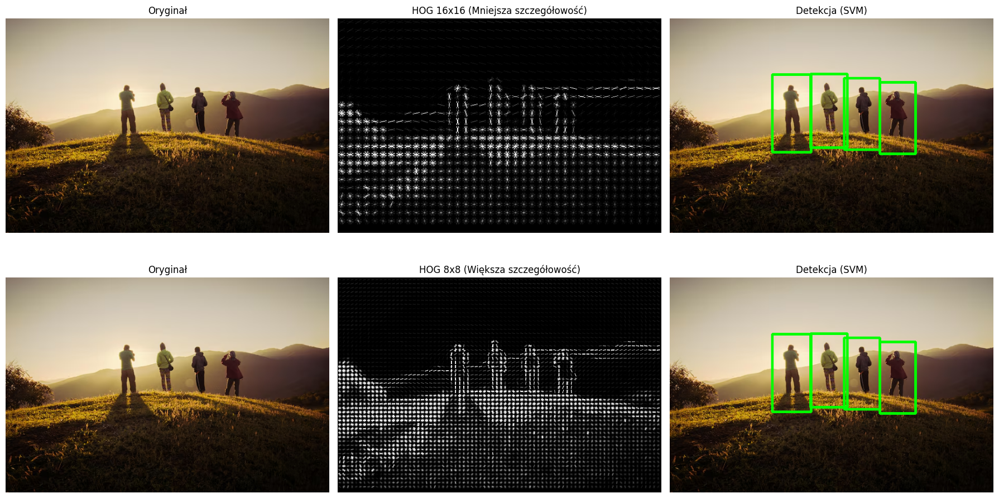

Długość wektora cech (16x16): 7800
Długość wektora cech (8x8):   31824


In [33]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import exposure

image_path = "./images/ppl.avif"
try:
    image = plt.imread(image_path)
except FileNotFoundError:
    image = np.zeros((400, 600, 3), dtype=np.uint8)
    cv2.putText(image, 'Plik nie znaleziony!', (50, 200), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

if len(image.shape) == 2:
    image = np.stack([image]*3, axis=-1)

fd_16, hog_16 = hog(
    image, orientations=8, pixels_per_cell=(16, 16),
    cells_per_block=(1, 1), visualize=True, channel_axis=-1
)
hog_rescaled_16 = exposure.rescale_intensity(hog_16, in_range=(0, 10))

fd_8, hog_8 = hog(
    image, orientations=8, pixels_per_cell=(8, 8),
    cells_per_block=(1, 1), visualize=True, channel_axis=-1
)
hog_rescaled_8 = exposure.rescale_intensity(hog_8, in_range=(0, 10))

gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
hog_cv = cv2.HOGDescriptor()
hog_cv.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())
rects, _ = hog_cv.detectMultiScale(gray, winStride=(8, 8), padding=(16, 16), scale=1.05)

img_detected = image.copy()
for (x, y, w, h) in rects:
    cv2.rectangle(img_detected, (x, y), (x + w, y + h), (0, 255, 0), 3)

fig, axs = plt.subplots(2, 3, figsize=(18, 10))

axs[0, 0].imshow(image)
axs[0, 0].set_title("Oryginał")
axs[0, 1].imshow(hog_rescaled_16, cmap='gray')
axs[0, 1].set_title("HOG 16x16 (Mniejsza szczegółowość)")
axs[0, 2].imshow(img_detected)
axs[0, 2].set_title("Detekcja (SVM)")

axs[1, 0].imshow(image)
axs[1, 0].set_title("Oryginał")
axs[1, 1].imshow(hog_rescaled_8, cmap='gray')
axs[1, 1].set_title("HOG 8x8 (Większa szczegółowość)")
axs[1, 2].imshow(img_detected)
axs[1, 2].set_title("Detekcja (SVM)")

for ax in axs.flat:
    ax.axis('off')

plt.tight_layout()
plt.show()

print(f"Długość wektora cech (16x16): {len(fd_16)}")
print(f"Długość wektora cech (8x8):   {len(fd_8)}")

### Wnioski: 
Widzimy, że siatka HOG 8x8 jest dużo bardziej szczegółowa. W niektórych przypadkach może to znacznie polepszych doświadczenie i uprościć wykrywanie obiektów. W naszym przypadku nie ma to jednak znaczenia, ponieważ SVM używany w tej implementacji był wcześniej wytrenowany na HOG korzystającym z siatki 8x8.

---
## 7. Analiza parametru kroku piramidy skalowania - `scale`

Jak krok piramidy skalowania (`scale`) wpływa na liczbę detekcji, fałszywe alarmy i czas obliczeń?

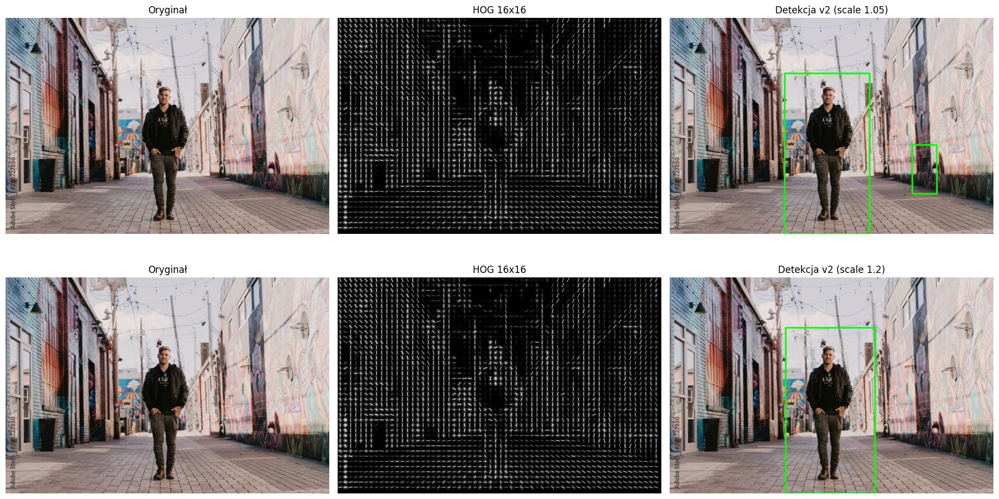

In [34]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import exposure

image_path = "./images/zdj.jpg"
try:
    image = plt.imread(image_path)
except FileNotFoundError:
    image = np.zeros((400, 600, 3), dtype=np.uint8)
    cv2.putText(image, 'Plik nie znaleziony!', (50, 200), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

if len(image.shape) == 2:
    image = np.stack([image]*3, axis=-1)

gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
hog_cv = cv2.HOGDescriptor()
hog_cv.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

fd_16, hog_16 = hog(
    image, orientations=8, pixels_per_cell=(16, 16),
    cells_per_block=(1, 1), visualize=True, channel_axis=-1
)
hog_rescaled_16 = exposure.rescale_intensity(hog_16, in_range=(0, 10))

rects_16, _ = hog_cv.detectMultiScale(
    gray, 
    winStride=(8, 8), 
    padding=(16, 16), 
    scale=1.05
)

img_det_16 = image.copy()
for (x, y, w, h) in rects_16:
    cv2.rectangle(img_det_16, (x, y), (x + w, y + h), (0, 255, 0), 3)

fd_8, hog_8 = hog(
    image, orientations=8, pixels_per_cell=(16, 16),
    cells_per_block=(1, 1), visualize=True, channel_axis=-1
)
hog_rescaled_8 = exposure.rescale_intensity(hog_8, in_range=(0, 10))

rects_8, _ = hog_cv.detectMultiScale(
    gray,
    winStride=(8, 8),
    padding=(16, 16),
    scale=1.2,
)
img_det_8 = image.copy()
for (x, y, w, h) in rects_8:
    cv2.rectangle(img_det_8, (x, y), (x + w, y + h), (0, 255, 0), 3)

fig, axs = plt.subplots(2, 3, figsize=(18, 10))

axs[0, 0].imshow(image)
axs[0, 0].set_title("Oryginał")
axs[0, 1].imshow(hog_rescaled_16, cmap='gray')
axs[0, 1].set_title("HOG 16x16")
axs[0, 2].imshow(img_det_16)
axs[0, 2].set_title(f"Detekcja v2 (scale 1.05)")

axs[1, 0].imshow(image)
axs[1, 0].set_title("Oryginał")
axs[1, 1].imshow(hog_rescaled_8, cmap='gray')
axs[1, 1].set_title("HOG 16x16")
axs[1, 2].imshow(img_det_8)
axs[1, 2].set_title(f"Detekcja v2 (scale 1.2)")

for ax in axs.flat:
    ax.axis('off')

plt.tight_layout()
plt.show()

Wpływ parametru scale na jakość detekcji (v1 vs v2):
- Wersja v1 (scale=1.05): Obraz jest zmniejszany bardzo delikatnie - o 5% na każdym poziomie piramidy. Tworzy to gęstą strukturę warstw, przez co detektor analizuje sylwetkę wielokrotnie przy minimalnie różnych rozmiarach okna. Efektem jest powstawanie "chmury" wielu nakładających się na siebie ramek dla jednego człowieka.

- Wersja v2 (scale=1.2): Zwiększenie kroku skalowania do 20% spowodowało, że piramida obrazu stała się rzadsza. Klasyfikator SVM miał mniej okazji do "pomyłki" i wygenerowania nadmiarowych prostokątów. Pozwoliło to na uzyskanie czystej, pojedynczej ramki wokół wykrytego obiektu, bez konieczności stosowania dodatkowych filtrów.

---
## 8. Wpływ parametrów szukania (krok okna i skala) na detekcję
W tym eksperymencie badaliśmy funkcję `detectMultiScale`, która odpowiada za lokalizowanie ludzi na obrazie. Mechanizm ten przesuwa wirtualną ramkę (okno) po zdjęciu i stopniowo je pomniejsza (tworząc tzw. piramidę obrazów), aby wykryć postacie stojące zarówno blisko (duże), jak i daleko (małe). Zmienialiśmy dwa główne parametry: **winStride** (krok okna) oraz **scale** (skok pomniejszania obrazu).

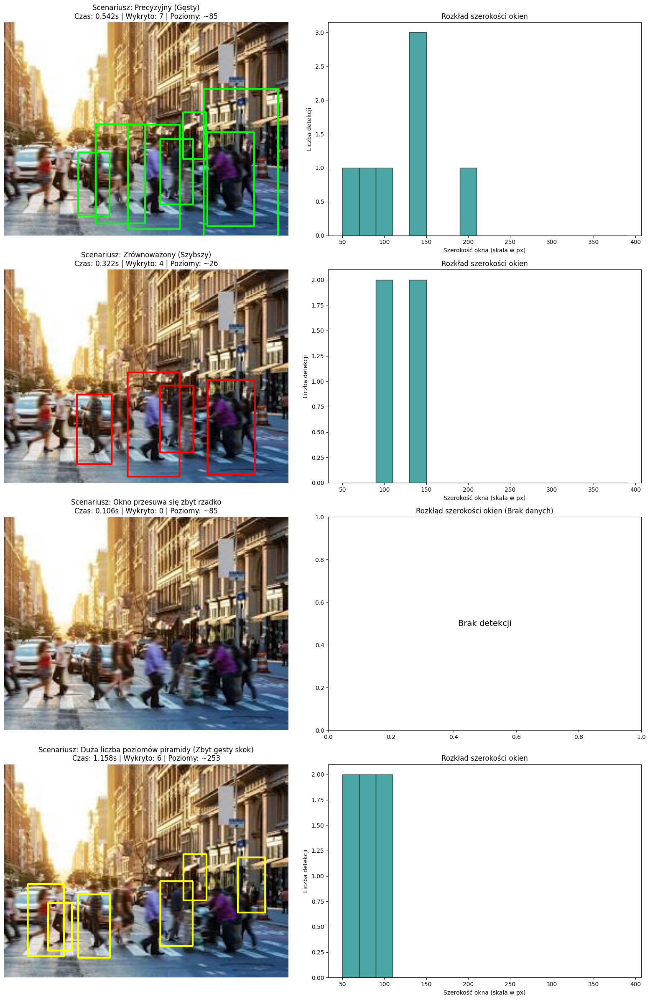

In [35]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import exposure
import time

img_path = "images/zdj2.jfif"
image_raw = cv2.imread(img_path)
image_raw = cv2.cvtColor(image_raw, cv2.COLOR_BGR2RGB)
image_res = cv2.resize(image_raw, (800, 600))
gray = cv2.cvtColor(image_res, cv2.COLOR_RGB2GRAY)

hog_cv = cv2.HOGDescriptor()
hog_cv.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

scenarios = [
    {
        "name": "Precyzyjny (Gęsty)",
        "winStride": (4, 4),
        "scale": 1.03,
        "color": (0, 255, 0)
    },
    {
        "name": "Zrównoważony (Szybszy)",
        "winStride": (4, 4),
        "scale": 1.1,
        "color": (255, 0, 0)
    },
    {
        "name": "Okno przesuwa się zbyt rzadko",
        "winStride": (16, 16),
        "scale": 1.03,
        "color": (255, 165, 0)
    },
    {
        "name": "Duża liczba poziomów piramidy (Zbyt gęsty skok)",
        "winStride": (4, 4),
        "scale": 1.01,
        "color": (255, 255, 0)
    }
]

fig, axes = plt.subplots(4, 2, figsize=(16, 24))

for i, spec in enumerate(scenarios):
    levels = int(np.log(64 / 800) / np.log(1 / spec["scale"]))

    start_time = time.time()
    rects, weights = hog_cv.detectMultiScale(
        gray,
        winStride=spec["winStride"],
        padding=(8, 8),
        scale=spec["scale"]
    )
    duration = time.time() - start_time

    res_img = image_res.copy()
    for (x, y, w, h) in rects:
        cv2.rectangle(res_img, (x, y), (x + w, y + h), spec["color"], 3)

    axes[i, 0].imshow(res_img)
    axes[i, 0].set_title(f"Scenariusz: {spec['name']}\nCzas: {duration:.3f}s | Wykryto: {len(rects)} | Poziomy: ~{levels}")
    axes[i, 0].axis('off')

    if len(rects) > 0:
        widths = [w for (x, y, w, h) in rects]
        axes[i, 1].hist(widths, bins=range(50, 400, 20), color='teal', alpha=0.7, edgecolor='black')
        axes[i, 1].set_xlabel("Szerokość okna (skala w px)")
        axes[i, 1].set_ylabel("Liczba detekcji")
        axes[i, 1].set_title(f"Rozkład szerokości okien")
    else:
        axes[i, 1].text(0.5, 0.5, "Brak detekcji", ha='center', va='center', fontsize=14)
        axes[i, 1].set_title("Rozkład szerokości okien (Brak danych)")

plt.tight_layout()
plt.show()

* **Zrównoważony skok (1.03 - Scenariusz 1):** Zapewnia optymalną liczbę warstw piramidy. Pozwala wykryć ludzi o zróżnicowanej wielkości w rozsądnym czasie.
* **Zbyt duży skok (1.10 - Scenariusz 2):** Obraz pomniejsza się aż o 10% na krok. Warstw jest mało, więc program działa **błyskawicznie**, ale ryzykujemy, że postać o konkretnym rozmiarze nie zostanie wykryta i uzyskamy false negative.
* **Zbyt gęsty skok (1.01 - Scenariusz 4):** Zdjęcie jest pomniejszane zaledwie o 1% na krok. Generuje to ogromną liczbę poziomów piramidy. Komputer marnuje mnóstwo czasu na analizowanie niemal identycznych rozmiarów obrazu, co drastycznie wydłuża czas (w sekundach) i kompletnie marnuje moc obliczeniową.

* **Gdy ustawimy mały krok, np. **(4, 4)** (Scenariusze 1, 2, 4)**, algorytm sprawdza obraz bardzo dokładnie. Ramki ściśle otaczają sylwetki, ale komputer musi wykonać znacznie więcej operacji, co wydłuża czas analizy.
* **Gdy ustawimy zbyt duży krok, np. **(16, 16)** (Scenariusz 3)**, ramka "skacze" za daleko. Program działa bardzo szybko, ale staje się nieprecyzyjny - ramki mogą być krzywo przesunięte, a niektóre postacie mogą zostać całkowicie pominięte, ponieważ detektor nad nimi przeskoczył. To się właśnie wydarzyło u nas.

### Wnioski: 
* **Do systemów działających w czasie rzeczywistym (np. wideo):** Najlepiej sprawdza się Scenariusz 2 (`scale=1.1`, krok okna `(4,4)` lub `(8,8)`). Zyskujemy ogromną płynność działania (więcej klatek na sekundę) kosztem minimalnego spadku precyzji.
* **Do analizy zdjęć (gdzie liczy się tylko idealny wynik):** Najlepszy jest Scenariusz 1 (`scale=1.03` - `1.05` i `winStride=(4,4)`), gwarantuje najwyższą dokładność wykrywania obiektów z badanych przykładów.

---
## 9. Odporność HOG na rozmycie obrazu (szum Gaussa)
W tym eksperymencie sprawdzaliśmy odporność algorytmu na pogorszenie jakości obrazu (np. mgłę, brudny obiektyw czy brak ostrości). Użyliśmy filtru Gaussa z różnymi wartościami parametru **Sigma** (im większa Sigma, tym silniejsze rozmycie zdjęcia).

**Hipoteza:** HOG jest odporny na małe rozmycia, bo opiera się na gradientach (krawędziach), a nie pikselach. Sprawdzamy, przy jakim poziomie rozmycia detekcja zawodzi.  
Dla każdego `sigma` wyświetlamy wynik detekcji (zielone ramki) i mapę gradientów HOG.

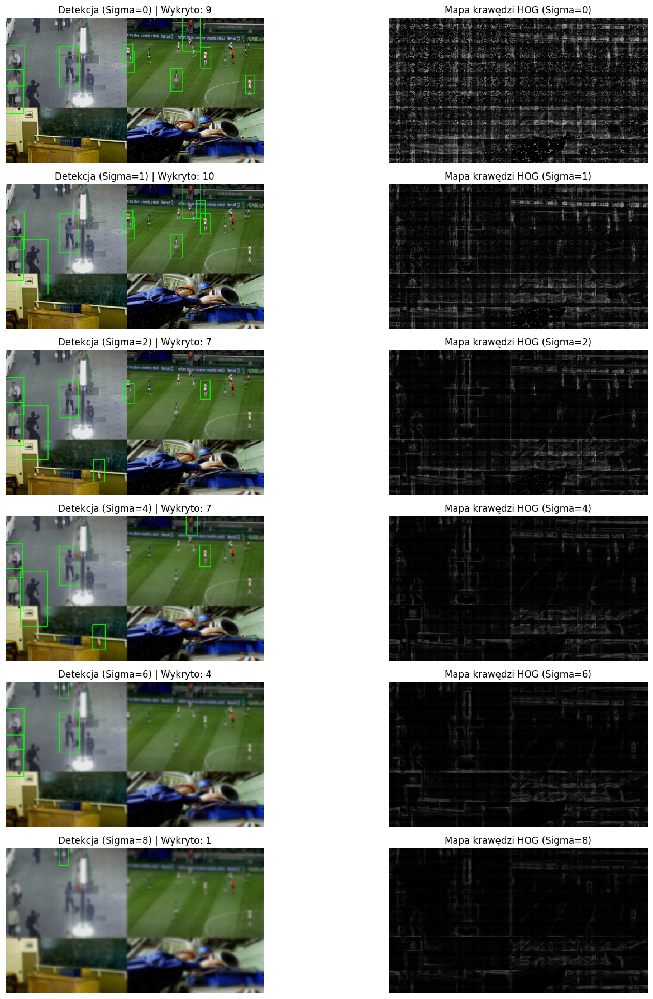

In [36]:
import cv2
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import exposure

img_bgr = cv2.imread("images/zdj2.jpg")
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

hog_cv = cv2.HOGDescriptor()
hog_cv.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

sigmas = [0, 1, 2, 4, 6, 8]
fig, axes = plt.subplots(len(sigmas), 2, figsize=(16, 18))

for idx, s in enumerate(sigmas):
    if s > 0:
        img_blurred = cv2.GaussianBlur(img_rgb, (0, 0), s)
    else:
        img_blurred = img_rgb.copy()

    gray_input = cv2.cvtColor(img_blurred, cv2.COLOR_RGB2GRAY)

    rects, _ = hog_cv.detectMultiScale(
        gray_input, winStride=(8, 8), padding=(16, 16), scale=1.05
    )

    img_detected = img_blurred.copy()
    for x, y, w, h in rects:
        cv2.rectangle(img_detected, (x, y), (x + w, y + h), (0, 255, 0), 3)

    _, hog_viz = hog(
        img_blurred,
        orientations=9,
        pixels_per_cell=(8, 8),
        cells_per_block=(2, 2),
        visualize=True,
        channel_axis=-1,
    )

    hog_rescaled = exposure.rescale_intensity(hog_viz, in_range=(0, 10))

    axes[idx, 0].imshow(img_detected)
    axes[idx, 0].set_title(f"Detekcja (Sigma={s}) | Wykryto: {len(rects)}")
    axes[idx, 0].axis("off")

    axes[idx, 1].imshow(hog_rescaled, cmap="gray")
    axes[idx, 1].set_title(f"Mapa krawędzi HOG (Sigma={s})")
    axes[idx, 1].axis("off")

plt.tight_layout()
plt.show()

### Jak rozmycie wpływa na działanie algorytmu HOG?
Algorytm HOG opiera się na **gradientach**, czyli wykrywaniu nagłych zmian jasności (ostrych krawędzi), które tworzą kształt człowieka. Rozmycie Gaussa wygładza te przejścia. Sprawia to, że ostre krawędzie znikają, a wartości gradientów drastycznie maleją. Komputer przestaje dostrzegać kontury sylwetki.

### Wyniki dla poszczególnych wartości Sigma:
* **Sigma = 0 (brak rozmycia):** Krawędzie są ostre, algorytm HOG precyzyjnie rysuje mapę konturów, a klasyfikator SVM bez problemu wykrywa ludzi.
* **Sigma = 1 (lekkie rozmycie):** Działa trochę jak filtr oczyszczający. Usuwa drobne zakłócenia i szum z aparatu, ale kluczowe krawędzie sylwetki wciąż są widoczne. Detekcja nadal działa poprawnie.
* **Sigma = 2 do 4 (spore rozmycie):** Kontury postaci zaczynają się zamazywać i zlewać z tłem. Liczba wykrytych osób gwałtownie spada – detektor zaczyna przegapiać ludzi.
* **Sigma = 6 i więcej:** Obraz staje się rozmazany. Na mapie krawędzi HOG nie ma już żadnych zorganizowanych kształtów. Maleje liczba detekcji.

### Wnioski:
Metoda HOG + SVM jest wrażliwa na ostrość obrazu. W przeciwieństwie do nowoczesnych sieci neuronowych, klasyczny HOG nie radzi sobie, kiedy krawędzie przestają być wyraźne. Projektując system z użyciem tej metody, trzeba zadbać o dobrą jakość obrazu i odpowiednie oświetlenie, bo nawet średnie rozmycie może uniemożliwić wykrycie człowieka.

---
## 10. Wpływ jasności obrazu (korekcja gamma)

W tym eksperymencie badaliśmy, jak zmiana jasności i kontrastu (korekcja Gamma) wpływa na widoczność krawędzi oraz skuteczność klasyfikatora SVM.

**Hipoteza:** HOG zawiera opcję `transform_sqrt` (normalizacja gamma), która ma zwiększać odporność na zmianę oświetlenia. Sprawdzamy, jak silne rozjaśnienie/przyciemnienie degraduje detekcję.

- **Gamma < 1** - obraz ciemniejszy
- **Gamma = 1** - obraz oryginalny
- **Gamma > 1** - obraz jaśniejszy

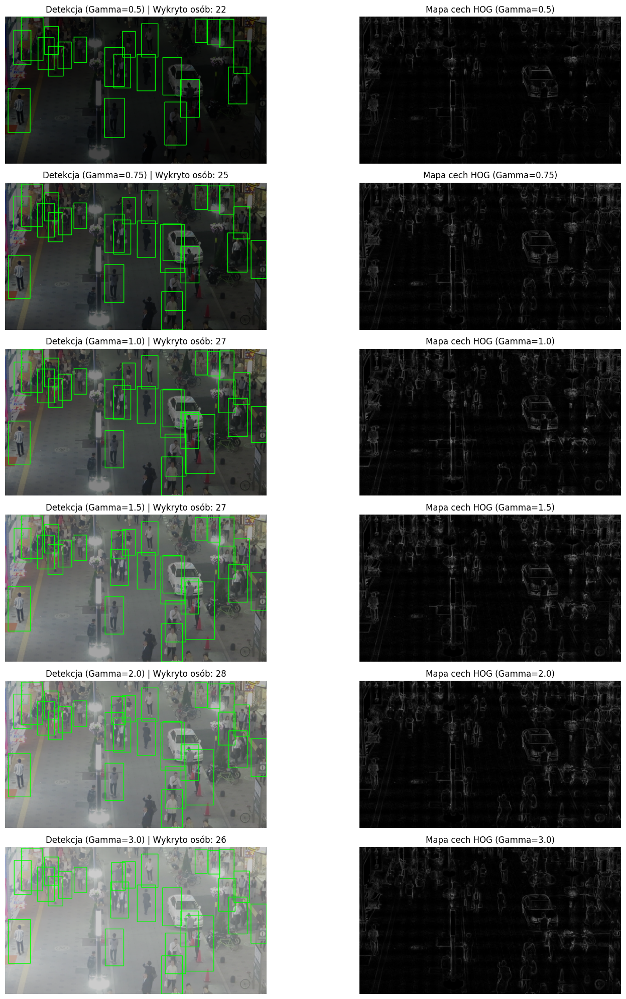

In [37]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import exposure


def adjust_gamma(image, gamma=1.0):
	invGamma = 1.0 / gamma
	table = np.array([((i / 255.0) ** invGamma) * 255
		for i in np.arange(0, 256)]).astype("uint8")
	return cv2.LUT(image, table)


img_raw = cv2.imread("images/tlum2.png")
img_rgb = cv2.cvtColor(img_raw, cv2.COLOR_BGR2RGB)

hog_cv = cv2.HOGDescriptor()
hog_cv.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

gamma_values = [0.5, 0.75, 1.0, 1.5, 2.0, 3.0]
fig, axes = plt.subplots(len(gamma_values), 2, figsize=(16, 20))

for idx, g in enumerate(gamma_values):
    img_gamma = adjust_gamma(img_rgb, g)
    gray_gamma = cv2.cvtColor(img_gamma, cv2.COLOR_RGB2GRAY)

    rects, weights = hog_cv.detectMultiScale(
        gray_gamma, winStride=(8, 8), padding=(16, 16), scale=1.05
    )

    img_detected = img_gamma.copy()
    for x, y, w, h in rects:
        cv2.rectangle(img_detected, (x, y), (x + w, y + h), (0, 255, 0), 3)

    fd, hog_viz = hog(
        img_gamma,
        orientations=9,
        pixels_per_cell=(8, 8),
        cells_per_block=(2, 2),
        visualize=True,
        channel_axis=-1,
    )

    hog_rescaled = exposure.rescale_intensity(hog_viz, in_range=(0, 10))

    axes[idx, 0].imshow(img_detected)
    axes[idx, 0].set_title(
        f"Detekcja (Gamma={g}) | Wykryto osób: {len(rects)}"
    )
    axes[idx, 0].axis("off")

    axes[idx, 1].imshow(hog_rescaled, cmap="gray")
    axes[idx, 1].set_title(f"Mapa cech HOG (Gamma={g})")
    axes[idx, 1].axis("off")

plt.tight_layout()
plt.show()

* Przy małym gamma obraz staje się zbyt ciemny, a ciemniejsze i średnie tony zlewają się w jednolitą, czarną plamę. Na mapie cech HOG wyraźnie widać, że w niedoświetlonych miejscach gradienty całkowicie znikają.
* Przy umiarkowanych zmianach oświetlenia (Gamma od 0.75 do 2) algorytm zachowuje stabilność, a liczba wykrytych osób drastycznie się nie zmienia. Wynika to z matematycznej konstrukcji HOG - algorytm grupuje piksele w bloki i normalizuje w nich kontrast. Dzięki temu drobne zmiany jasności są automatycznie niwelowane.
* Przy skrajnym rozjaśnieniu oświetlenia (Gamma = 3) obraz staje się nienaturalnie jasny i "wyblakły". Kontury sylwetek zlewają się z jasnym tłem, co utrudnia klasyfikatorowi SVM prawidłowe rozpoznanie kształtu człowieka.

### Wnioski:
Chociaż HOG posiada odporność na równomierne zmiany oświetlenia dzięki normalizacji bloków, to nie radzi sobie ze skrajnym brakiem kontrastu. Najbardziej niepożądane dla algorytmu jest zbyt silne przyciemnienie lub rozjaśnianie obrazu, które usuwa informacje o krawędziach, utrudniając tym poprawną detekcję.

## 11. Wpływ rotacji

Klasyczny detektor HOG + SVM opiera się na histogramach orientacji gradientów, które są zależne od obrotu. Standardowy model był trenowany wyłącznie na osobach stojących pionowo. W tym eksperymencie dokonywaliśmy rotacji obrazu o zadane kąty i sprawdziliśmy, jak wpływa to na skuteczność detekcji oraz jak zmienia się wizualizacja cech HOG.

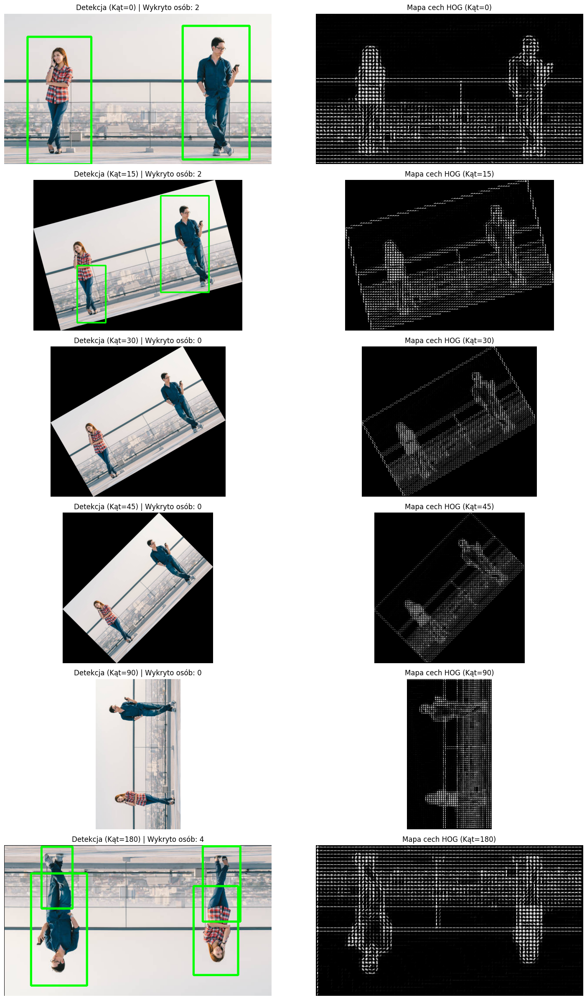

In [38]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import exposure

# z https://www.technetexperts.com/uncropped-rotation-opencv/
def rotate_image(img, angle):
    (h, w) = img.shape[:2]
    (cX, cY) = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D((cX, cY), angle, 1.0)
    
    cos = np.abs(M[0, 0])
    sin = np.abs(M[0, 1])
    
    # Calculate new bounding dimensions
    nW = int((h * sin) + (w * cos))
    nH = int((h * cos) + (w * sin))
    
    # Adjust translation for centering
    M[0, 2] += (nW / 2) - cX
    M[1, 2] += (nH / 2) - cY
    
    return cv2.warpAffine(img, M, (nW, nH))

img_raw = cv2.imread("./images/zdj6.png")
if img_raw is None:
    raise FileNotFoundError("Nie znaleziono pliku.")

img_rgb = cv2.cvtColor(img_raw, cv2.COLOR_BGR2RGB)

hog_cv = cv2.HOGDescriptor()
hog_cv.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

angles = [0, 15, 30, 45, 90, 180]
fig, axes = plt.subplots(len(angles), 2, figsize=(16, 4 * len(angles)))

for idx, angle in enumerate(angles):
    img_rotated = rotate_image(img_rgb, angle)
    gray_rotated = cv2.cvtColor(img_rotated, cv2.COLOR_RGB2GRAY)

    rects, weights = hog_cv.detectMultiScale(
        gray_rotated, winStride=(8, 8), padding=(16, 16), scale=1.05
    )

    img_detected = img_rotated.copy()
    for x, y, w, h in rects:
        cv2.rectangle(img_detected, (x, y), (x + w, y + h), (0, 255, 0), 3)

    fd, hog_viz = hog(
        img_rotated,
        orientations=9,
        pixels_per_cell=(8, 8),
        cells_per_block=(2, 2),
        visualize=True,
        channel_axis=-1,
    )
    hog_rescaled = exposure.rescale_intensity(hog_viz, in_range=(0, 10))

    axes[idx, 0].imshow(img_detected)
    axes[idx, 0].set_title(
        f"Detekcja (Kąt={angle}) | Wykryto osób: {len(rects)}"
    )
    axes[idx, 0].axis("off")

    axes[idx, 1].imshow(hog_rescaled, cmap="gray")
    axes[idx, 1].set_title(f"Mapa cech HOG (Kąt={angle})")
    axes[idx, 1].axis("off")

plt.tight_layout()
plt.show()

### Wnioski
- Dla kątów 0 i 15 poprawnie wykryto 2 osoby. Wektor cech HOG dla obrazu obróconego o 15 stopni jest wciąż na tyle podobny do wzorca pionowej sylwetki, że hiperpłaszczyzna SVM klasyfikuje go jako pozytywny.
- Przypadki rotacji 30, 45, 90 stopni potwierdzają, że HOG nie jest odporny na rotację. Krawędzie, które normalnie były pionowe, stają się ukośne lub poziome. Dla SVM taki zestaw cech wygląda zupełnie inaczej niż człowiek.
- Dla rotacji 180 wykryto 4 zamiast 2 osób, układ szczegółów (głowa na dole, buty na górze) jest zaburzony, wygenerowane zostały false positives
- Działanie dobre tylko dla pionowych lub niewiele obróconych sylwetek

---
## 12. Własne eksperymenty

Poniższa komórka to przestrzeń interaktywna. Dostosuj wartości podanych na początku komórki parametrów i uruchom komórkę ponownie, by badać ich wpływ na działanie metody.


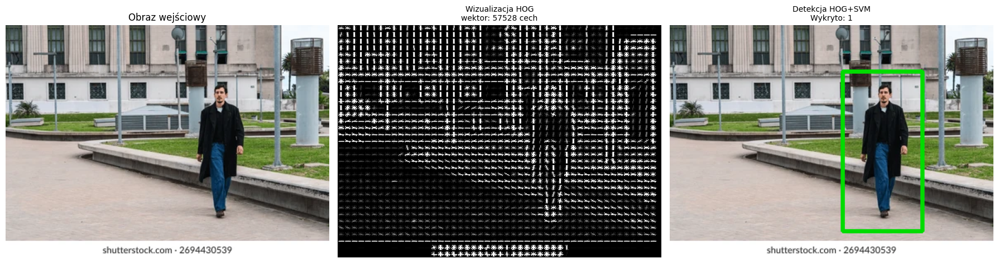

In [39]:
# ---------------------------------------------------
# DOSTOSUJ TE PARAMETRY I URUCHOM KOMÓRKĘ PONOWNIE
# ---------------------------------------------------
MY_PATH_TO_IMAGE = "images/zdj5.webp"  # ścieżka do obrazu, przykładowe obrazy w folderze images/ lub podaj własną ścieżkę
MY_ORIENTATIONS  = 9                   # liczba binów kątowych
MY_PPC           = (8, 8)              # pixels_per_cell np. (4,4) | (8,8) | (16,16)
MY_CPB           = (2, 2)              # cells_per_block np. (1,1) | (2,2) | (3,3)
MY_NORM          = 'L2'            # np. 'L1', 'L1-sqrt', 'L2', 'L2-Hys'
MY_STRIDE        = (8, 8)              # krok sliding window
MY_PADDING       = (16, 16)            # padding dla sliding window
MY_SCALE         = 1.05                # krok piramidy skali




# -----------------------------------------------
#        Nie zmieniaj poniższego kodu!
# -----------------------------------------------
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import exposure

img_raw = cv2.imread(MY_PATH_TO_IMAGE)
if img_raw is None:
    raise FileNotFoundError("Nie znaleziono pliku. Sprawdź ścieżkę.")
img_rgb = cv2.cvtColor(img_raw, cv2.COLOR_BGR2RGB)


fd, hog_viz = hog(
    img_rgb,
    orientations=MY_ORIENTATIONS,
    pixels_per_cell=MY_PPC,
    cells_per_block=MY_CPB,
    block_norm=MY_NORM,
    visualize=True,
    channel_axis=-1,
)
hog_resc = exposure.rescale_intensity(hog_viz, in_range=(0, 10))

hog_detector = cv2.HOGDescriptor()
hog_detector.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())
gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

rects, weights = hog_detector.detectMultiScale(
    gray, winStride=MY_STRIDE, padding=MY_PADDING, scale=MY_SCALE
)

result = img_rgb.copy()
for i, (x, y, w, h) in enumerate(rects):
    cv2.rectangle(result, (x, y), (x+w, y+h), (0, 220, 0), 3)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(img_rgb, cmap='gray' if img_rgb.ndim == 2 else None)
axes[0].set_title("Obraz wejściowy", fontsize=12)
axes[0].axis('off')

axes[1].imshow(hog_resc, cmap='gray')
axes[1].set_title(f"Wizualizacja HOG\nwektor: {len(fd)} cech", fontsize=10)
axes[1].axis('off')

axes[2].imshow(result)
axes[2].set_title(f"Detekcja HOG+SVM\nWykryto: {len(rects)}", fontsize=10)
axes[2].axis('off')

plt.tight_layout()
plt.show()

---
## 13. Wnioski - stosowalność metody HOG+SVM

### Optymalne ustawienia na podstawie naszych eksperymentów

```python
orientations    = 9          # złoty standard Dalal & Triggs
pixels_per_cell = (8, 8)     # dobry dla okna 64×128 px
cells_per_block = (2, 2)     # daje lokalną normalizację cech na małym sąsiedztwie
transform_sqrt  = True       # poprawia odporność na zmianę oświetlenia
winStride       = (8, 8)     # kompromis dokładność/czas
scale           = 1.20       # jeśli zależy na szybkości i umiarkowanej dokładności
```

### Kiedy metoda działa dobrze?
- Proste sceny niewieloma stojącymi osobami
- Dobre oświetlenie i wyraźny kontrast między postacią a tłem
- Osoby widoczne w całości lub w dużej części

### Kiedy metoda zawodzi?
- Osoby w nietypowych pozycjach (siedzące, obrócone, pochylone)
- Tłum, nachodzące sylwetki
- Częściowe zasłonięcie (np. za meblami, innymi ludźmi)
- Złożone, teksturowane tło (np. kraty, drzewa, tłum)
- Niska rozdzielczość lub silny szum
- Duże zmiany perspektywy
- Niewyraźne zdjęcia
- Duże rozjaśnienie zdjęć

**Wnioski:**
- Doskonała jako metoda dydaktyczna i punkt odniesienia
- Nadal może być używana w prostych, dobrze kontrolowanych środowiskach
- W większości nowoczesnych aplikacji lepiej zastosować rozwiązania oparte na głębokim uczeniu  
- Dobre do zastosowań z ograniczonymi zasobami
- Parametry mają znaczenie, dla różnych środowisk mogą być różne optima

HOG+SVM jest metodą klasyczną opublikowaną w 2005 roku. Dziś sieci CNN takie jak YOLO czy Faster R-CNN osiągają wyraźnie lepszą dokładność. HOG+SVM pozostaje jednak wartościowy jako metoda edukacyjna. HOG może być przydatne, aby zrozumieć działanie deskryptorów cech. Przy bardziej złożonych problemach lepiej korzystać z rozwiązań opartych na sieciach głębokich, które mogą rozwiązywać problemy i niedoskonałości tej metody. 